<a href="https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Fine-tuning DETR on a custom dataset for object detection

In this notebook, we are going to fine-tune [DETR](https://ai.facebook.com/blog/end-to-end-object-detection-with-transformers/) (end-to-end object detection with Transformers) on a custom object detection dataset. The goal for the model is to recognize balloons in pictures.

* Original DETR paper: https://arxiv.org/abs/2005.12872
* Original DETR repo: https://github.com/facebookresearch/detr

Important note regarding **GPU memory**: `DetrFeatureExtractor` by default resizes each image to have a `min_size` of 800 pixels and a `max_size` of 1333 pixels (as these are the default values that DETR uses at *inference* time). Note that this can stress-test the memory of your GPU when *training* the model, as the images are flattened after sent through the convolutional backbone. The sequence length that is sent through the Transformer is typically of length (height*width/32^2). So if you consider an image of size (900, 900) for example, the sequence length is 900^2/32^2 = 791, which is larger than what NLP models like BERT use (512). It's advised to use a batch size of 2 on a single GPU. You can of course also initialize `DetrFeatureExtractor` with a smaller `size` and/or `max_size` to use bigger batches. 

Note regarding **augmentation**: DETR actually uses several image augmentations during training. One of them is **scale augmentation**: they set the `min_size` randomly to be one of [480, 512, 544, 576, 608, 640, 672, 704, 736, 768, 800] as can be seen [here](https://github.com/facebookresearch/detr/blob/a54b77800eb8e64e3ad0d8237789fcbf2f8350c5/datasets/coco.py#L122). However, we are not going to add any of the augmentations that are used in the original implementation during training. It works fine without them.

Also big thanks to the creator of [this notebook](https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb), which helped me a lot in understanding how to fine-tune DETR on a custom dataset.



## Set up environment

In [ ]:
!pip install -q transformers timm

     |████████████████████████████████| 2.6 MB 7.1 MB/s 
     |████████████████████████████████| 376 kB 72.8 MB/s 
     |████████████████████████████████| 895 kB 61.4 MB/s 
     |████████████████████████████████| 3.3 MB 57.6 MB/s 
     |████████████████████████████████| 636 kB 66.2 MB/s 


In [ ]:
!pip install -q pytorch-lightning

     |████████████████████████████████| 918 kB 8.8 MB/s 
     |████████████████████████████████| 829 kB 53.8 MB/s 
     |████████████████████████████████| 272 kB 28.5 MB/s 
     |████████████████████████████████| 118 kB 72.0 MB/s 
     |████████████████████████████████| 1.3 MB 53.1 MB/s 
     |████████████████████████████████| 142 kB 70.1 MB/s 
     |████████████████████████████████| 294 kB 73.9 MB/s 


## Download + preprocess data

Here we download the balloon dataset, hosted on Github.

In [2]:
# download, decompress the data
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
!unzip balloon_dataset.zip > /dev/null

"wget" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
El sistema no puede encontrar la ruta especificada.


In [1]:
import pytorch_lightning as pl

The balloon dataset comes in the VIA annotation format. However, to prepare the annotations for the model, `DetrFeatureExtractor` expects them to be in COCO format. The following cell clones a Github repo that includes a function to convert them into COCO format.

In [2]:
!git clone https://github.com/woctezuma/VIA2COCO
%cd VIA2COCO/
!git checkout fixes

C:\WORK\wamp\www\examples\Transformers-Tutorials\DETR\VIA2COCO


fatal: destination path 'VIA2COCO' already exists and is not an empty directory.


Your branch is up to date with 'origin/fixes'.


Already on 'fixes'


In [3]:
import convert as via2coco

data_path = './../balloon/'

first_class_index = 0

for keyword in ['train', 'val']:

  input_dir = data_path + keyword + '/'
  input_json = input_dir + 'via_region_data.json'
  categories = ['balloon']
  super_categories = ['N/A']
  output_json = input_dir + 'custom_' + keyword + '.json'

  print('Converting {} from VIA format to COCO format'.format(input_json))

  coco_dict = via2coco.convert(
      imgdir=input_dir,
      annpath=input_json,
      categories=categories,
      super_categories=super_categories,
      output_file_name=output_json,
      first_class_index=first_class_index,
  )

Converting ./../balloon/train/via_region_data.json from VIA format to COCO format
Saving to ./../balloon/train/custom_train.json
Converting ./../balloon/val/via_region_data.json from VIA format to COCO format
Saving to ./../balloon/val/custom_val.json


In [4]:
%cd ..

C:\WORK\wamp\www\examples\Transformers-Tutorials\DETR


## Create PyTorch dataset + dataloaders

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add a feature extractor (`DetrFeatureExtractor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [5]:
import torchvision
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)
        
        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

Based on the class defined above, we create training and validation datasets.

In [6]:
from transformers import DetrFeatureExtractor

feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetection(img_folder='./balloon/train', feature_extractor=feature_extractor)
val_dataset = CocoDetection(img_folder='./balloon/val', feature_extractor=feature_extractor, train=False)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


As you can see, this dataset is tiny:

In [7]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))

Number of training examples: 61
Number of validation examples: 13


Let's verify an example by visualizing it. We can access the COCO API of the dataset by typing `train_dataset.coco`. 

Image n°23


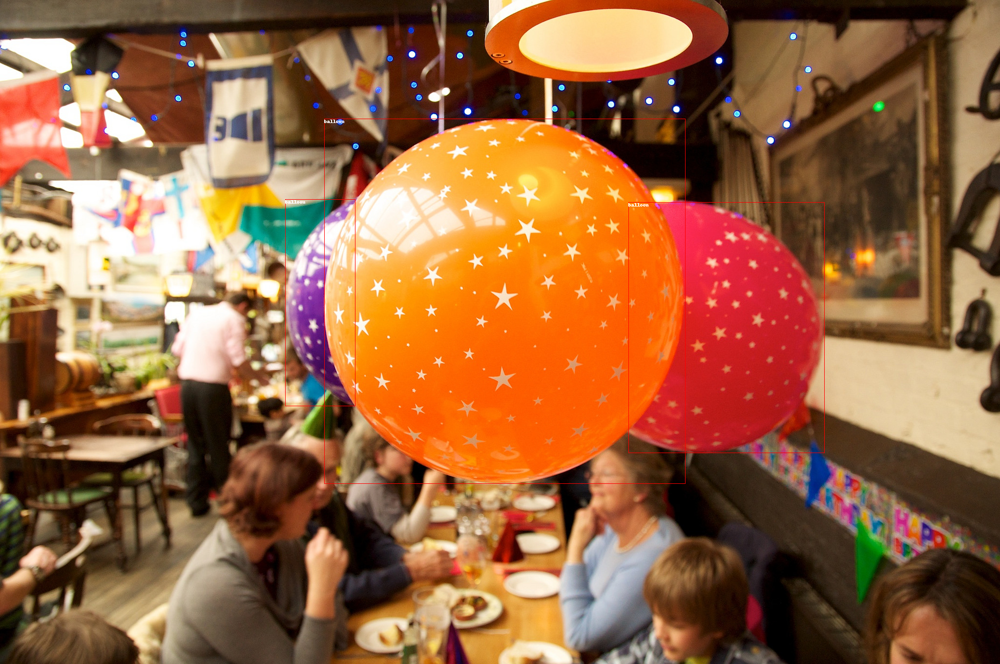

In [8]:
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('./balloon/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Next, let's create corresponding dataloaders. We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask` to indicate which pixels are real (1)/which are padding (0).  

In [9]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = feature_extractor.pad_and_create_pixel_mask(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch
batch_size=1  # 4,   2
train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=batch_size)
batch = next(iter(train_dataloader))

Let's verify the keys of a single batch:

In [10]:
batch.keys()

dict_keys(['pixel_values', 'pixel_mask', 'labels'])

Let's verify the shape of the `pixel_values`, and check the `target`::

In [11]:
pixel_values, target = train_dataset[0]

In [12]:
pixel_values.shape

torch.Size([3, 800, 1066])

In [13]:
print(target)

{'boxes': tensor([[0.5955, 0.5811, 0.2202, 0.3561]]), 'class_labels': tensor([0]), 'image_id': tensor([0]), 'area': tensor([3681.5083]), 'iscrowd': tensor([0]), 'orig_size': tensor([1536, 2048]), 'size': tensor([ 800, 1066])}


## Train the model using PyTorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters). 

You can of course just train the model in native PyTorch as an alternative.

In [14]:
import pytorch_lightning as pl
from transformers import DetrConfig, DetrForObjectDetection
import torch

class Detr(pl.LightningModule):

     def __init__(self, lr, lr_backbone, weight_decay):
         super().__init__()
         # replace COCO classification head with custom head
         self.model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", 
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.lr_backbone = lr_backbone
         self.weight_decay = weight_decay

     def forward(self, pixel_values, pixel_mask):
       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

       return outputs
     
     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       pixel_mask = batch["pixel_mask"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        param_dicts = [
              {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
              {
                  "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                  "lr": self.lr_backbone,
              },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr,
                                  weight_decay=self.weight_decay)
        
        return optimizer

     def train_dataloader(self):
        return train_dataloader

     def val_dataloader(self):
        return val_dataloader

As PyTorch Lightning by default logs to Tensorboard, let's start it:

In [15]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

Launching TensorBoard...

Here we define the model, and verify the outputs.

In [16]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


The logits are of shape `(batch_size, num_queries, number of classes + 1)`. We model internally adds an additional "no object class", which explains why we have one additional output for the class dimension. 

In [17]:
outputs.logits.shape

torch.Size([1, 100, 2])

Next, let's train! We train for a maximum of 300 training steps, and also use gradient clipping. You can refresh Tensorboard above to check the various losses.

In [18]:
from pytorch_lightning import Trainer

trainer = Trainer(gpus=1, max_steps=300, gradient_clip_val=0.1)
trainer.fit(model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.037   Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

C:\Users\lbola\anaconda3\envs\deit\lib\site-packages\pytorch_lightning\trainer\data_loading.py:106: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  f"The dataloader, {name}, does not have many workers which may be a bottleneck."
C:\Users\lbola\anaconda3\envs\deit\lib\site-packages\pytorch_lightning\trainer\data_loading.py:106: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  f"The dataloader, {name}, does not have many workers which may be a bottleneck."


Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

## Evaluate the model

Finally, we evaluate the model on the validation set. The original DETR repo has some nice evaluation tools that we will use.

They are based on the `CocoEvaluator` class from torchvision, which in turn is based on [this](https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/cocoeval.py).

In [19]:
! git clone https://github.com/facebookresearch/detr.git
%cd ./detr

C:\WORK\wamp\www\examples\Transformers-Tutorials\DETR\detr


fatal: destination path 'detr' already exists and is not an empty directory.


Let's first load the ground truth COCO dataset:

In [20]:
from datasets import get_coco_api_from_dataset

base_ds = get_coco_api_from_dataset(val_dataset) # this is actually just calling the coco attribute

Let's run the evaluation:

In [21]:
from datasets.coco_eval import CocoEvaluator
from tqdm.notebook import tqdm
%cd ..

C:\WORK\wamp\www\examples\Transformers-Tutorials\DETR


In [22]:

iou_types = ['bbox']
coco_evaluator = CocoEvaluator(base_ds, iou_types) # initialize evaluator with ground truths

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)
model.eval()

print("Running evaluation...")

for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    outputs = model.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = feature_extractor.post_process(outputs, orig_target_sizes) # convert outputs of model to COCO api
    res = {target['image_id'].item(): output for target, output in zip(labels, results)}
    coco_evaluator.update(res)

coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

Running evaluation...


  0%|          | 0/13 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.420
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.721
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.450
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.384
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.623
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.496
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.514
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.396
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.652
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= l

## Inference (+ visualization)

Let's visualize the predictions of DETR on the first image of the validation set.

In [23]:
#We can use the image_id in target to know which image it is
pixel_values, target = val_dataset[1]

In [24]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 1066, 800])


In [25]:
# forward pass to get class logits and bounding boxes
outputs = model(pixel_values=pixel_values, pixel_mask=None)

In [26]:
import torch
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{id2label[cl.item()]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [27]:
def visualize_predictions(image, outputs, threshold=0.9):
  # keep only predictions with confidence >= threshold
  probas = outputs.logits.softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold
  
  # convert predicted boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

  # plot results
  plot_results(image, probas[keep], bboxes_scaled)

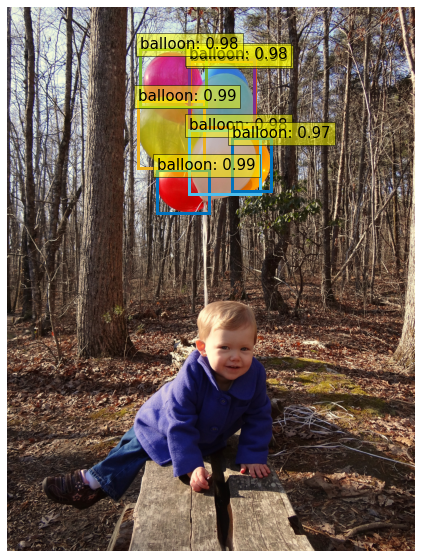

In [28]:
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('./balloon/val', image['file_name']))

visualize_predictions(image, outputs)

In [29]:
torch.save(model.state_dict(), "./ballon_model.pt")

In [30]:
torch.save(trainer.model.state_dict(), "./ballon_model.pth")

In [32]:
model_inf = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)
model_inf.load_state_dict(torch.load("./ballon_model.pth"))



Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

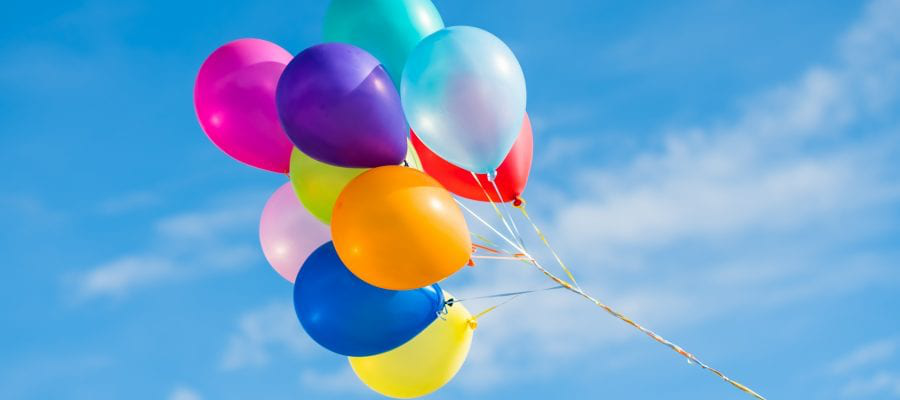

In [37]:
from PIL import Image
import requests

url = 'https://20fd661yccar325znz1e9bdl-wpengine.netdna-ssl.com/wp-content/uploads/2020/08/best-balloons-900x400.jpeg'
im = Image.open(requests.get(url, stream=True).raw)
im

In [38]:
encoding = feature_extractor(im, return_tensors="pt")
encoding.keys()

outputs = model_inf(**encoding)


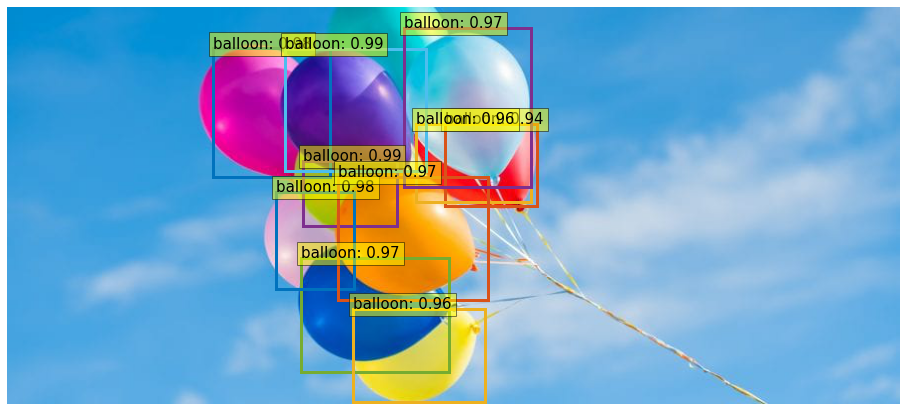

In [39]:
visualize_predictions(im, outputs)